# Importing The Libraries

In [1]:
import numpy as np
import cv2
import pandas as pd

In [2]:
from matplotlib import pyplot as plt
import os

In [3]:
from skimage.filters import roberts, sobel, scharr, prewitt
from scipy import ndimage as nd

In [4]:
import gif2numpy


# Extract Features from Images

In [5]:
# Next time change th path format
train_path = "D:\\Data sets\\DRIVE\\training"
train_ids = next(os.walk(train_path + "\\images"))[2]
gt_ids = next(os.walk(train_path + "\\1st_manual"))[2]

In [6]:
gt_ids

['21_manual1.gif',
 '22_manual1.gif',
 '23_manual1.gif',
 '24_manual1.gif',
 '25_manual1.gif',
 '26_manual1.gif',
 '27_manual1.gif',
 '28_manual1.gif',
 '29_manual1.gif',
 '30_manual1.gif',
 '31_manual1.gif',
 '32_manual1.gif',
 '33_manual1.gif',
 '34_manual1.gif',
 '35_manual1.gif',
 '36_manual1.gif',
 '37_manual1.gif',
 '38_manual1.gif',
 '39_manual1.gif',
 '40_manual1.gif']

In [7]:
train_ids

['21_training.tif',
 '22_training.tif',
 '23_training.tif',
 '24_training.tif',
 '25_training.tif',
 '26_training.tif',
 '27_training.tif',
 '28_training.tif',
 '29_training.tif',
 '30_training.tif',
 '31_training.tif',
 '32_training.tif',
 '33_training.tif',
 '34_training.tif',
 '35_training.tif',
 '36_training.tif',
 '37_training.tif',
 '38_training.tif',
 '39_training.tif',
 '40_training.tif']

In [8]:
def originalImg(img,df):
    img2 = img.reshape(-1)
    df['Original_Image'] = img2
    return df,img2

In [9]:
def gaborFilter(img2,df):
    #Generate Gabor features
    num = 1  
    kernels = []
    for theta in range(2):   
        theta = theta / 4. * np.pi
        for sigma in (1, 3): 
            for lamda in np.arange(0, np.pi, np.pi / 4):   
                for gamma in (0.05, 0.5):


                    gabor_label = 'Gabor' + str(num)
                    # print(gabor_label)
                    ksize=5
                    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)    
                    kernels.append(kernel)
                    
                    fimg = cv2.filter2D(img2, cv2.CV_8UC3, kernel)
                    filtered_img = fimg.reshape(-1)
                    df[gabor_label] = filtered_img 
                    
                    num += 1  #Increment for gabor column label
    return df

In [10]:
def cannyEdge(df,img):
    #CANNY EDGE
    edges = cv2.Canny(img, 10,200)   #Image, min and max values
    edges1 = edges.reshape(-1)
    df['Canny_Edge'] = edges1 #Add column to original dataframe
    return df

In [11]:
def the4edgeDetectors(df,img):
    edge_roberts = roberts(img)
    edge_roberts1 = edge_roberts.reshape(-1)
    df['Roberts'] = edge_roberts1
    
    #SOBEL
    edge_sobel = sobel(img)
    edge_sobel1 = edge_sobel.reshape(-1)
    df['Sobel'] = edge_sobel1
    
    #SCHARR
    edge_scharr = scharr(img)
    edge_scharr1 = edge_scharr.reshape(-1)
    df['Scharr'] = edge_scharr1
    
    #PREWITT
    edge_prewitt = prewitt(img)
    edge_prewitt1 = edge_prewitt.reshape(-1)
    df['Prewitt'] = edge_prewitt1
    
    return df

In [12]:
def gmv(df,img):
    #GAUSSIAN with sigma=3

    gaussian_img = nd.gaussian_filter(img, sigma=3)
    gaussian_img1 = gaussian_img.reshape(-1)
    df['Gaussian s3'] = gaussian_img1

    #GAUSSIAN with sigma=7
    gaussian_img2 = nd.gaussian_filter(img, sigma=7)
    gaussian_img3 = gaussian_img2.reshape(-1)
    df['Gaussian s7'] = gaussian_img3

    #MEDIAN with sigma=3
    median_img = nd.median_filter(img, size=3)
    median_img1 = median_img.reshape(-1)
    df['Median s3'] = median_img1

    #VARIANCE with size=3
    variance_img = nd.generic_filter(img, np.var, size=3)
    variance_img1 = variance_img.reshape(-1)
    df['Variance s3'] = variance_img1  #Add column to original dataframe
    return df

In [13]:
def gtImage(gt_path,df):
    frames, exts, image_specs = gif2numpy.convert(gt_path)
    frames = np.array(frames)
    labeled_img = frames.reshape(584, 565,3)
    labeled_img = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
    thresh = 0
    labeled_img = labeled_img > 0
    labeled_img1 = labeled_img.reshape(-1)
    df['Labels'] = labeled_img1
    return df

In [14]:
image_dataset = pd.DataFrame()

In [15]:
for _id in range(20):
    if _id in (17, 12, 0, 5, 10):
        print(_id)
        continue
    print('*',_id)
    image = train_ids[_id]
    gt_image = gt_ids[_id]
    
    df = pd.DataFrame()  #Temporary data frame for each Image
    
    path = train_path + "\\images\\" + image
    print(path)
    
    img = cv2.imread(path)
    img = img[:,:,1]
    df,img2 = originalImg(img,df)
    df['Image_Name'] = image
    df = gaborFilter(img2,df)
    
    df = cannyEdge(df,img)
    
    df = the4edgeDetectors(df,img)
    
    df = gmv(df,img)
    
    gt_path = train_path + "\\1st_manual\\" + gt_image
    print(gt_path)
    df = gtImage(gt_path,df)
    
    image_dataset = pd.concat([image_dataset,df])
    print(image_dataset.shape)

0
* 1
D:\Data sets\DRIVE\training\images\22_training.tif
D:\Data sets\DRIVE\training\1st_manual\22_manual1.gif
(329960, 44)
* 2
D:\Data sets\DRIVE\training\images\23_training.tif
D:\Data sets\DRIVE\training\1st_manual\23_manual1.gif
(659920, 44)
* 3
D:\Data sets\DRIVE\training\images\24_training.tif
D:\Data sets\DRIVE\training\1st_manual\24_manual1.gif
(989880, 44)
* 4
D:\Data sets\DRIVE\training\images\25_training.tif
D:\Data sets\DRIVE\training\1st_manual\25_manual1.gif
(1319840, 44)
5
* 6
D:\Data sets\DRIVE\training\images\27_training.tif
D:\Data sets\DRIVE\training\1st_manual\27_manual1.gif
(1649800, 44)
* 7
D:\Data sets\DRIVE\training\images\28_training.tif
D:\Data sets\DRIVE\training\1st_manual\28_manual1.gif
(1979760, 44)
* 8
D:\Data sets\DRIVE\training\images\29_training.tif
D:\Data sets\DRIVE\training\1st_manual\29_manual1.gif
(2309720, 44)
* 9
D:\Data sets\DRIVE\training\images\30_training.tif
D:\Data sets\DRIVE\training\1st_manual\30_manual1.gif
(2639680, 44)
10
* 11
D:\Data

In [16]:
image_dataset.head()

,Original_Image,Image_Name,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,...,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3,Labels
0,0,22_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
1,0,22_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
2,0,22_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
3,0,22_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False
4,0,22_training.tif,0,0,0,0,0,0,0,0,...,0,0.0,0.0,0.0,0.0,0,1,0,0,False


# Train and Test

In [17]:
x = image_dataset.drop(labels = ["Image_Name","Labels"], axis=1)
x[:10]

,Original_Image,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,Gabor9,...,Gabor32,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0.0,0.0,0.0,0.0,0,1,0,0


In [18]:
y = image_dataset["Labels"]
y[:10]

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
8    False
9    False
Name: Labels, dtype: bool

In [19]:
from sklearn.model_selection import train_test_split

In [20]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=20)

In [22]:
X_train.shape, X_test.shape

((3712050, 42), (1237350, 42))

# XGBoost Model

In [23]:
import xgboost as xgb

In [24]:
xg_cl = xgb.XGBClassifier(objective='binary:logistic', n_estimators=100, seed=123)
eval_set = [(X_train, y_train), (X_test, y_test)]

In [25]:
xg_cl.fit(X_train, y_train, eval_metric=["error"], eval_set=eval_set, verbose=True)
results = xg_cl.evals_result()

C:\Users\Shirsendu\AppData\Local\Programs\Python\Python38\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[0]	validation_0-error:0.07043	validation_1-error:0.07051
[1]	validation_0-error:0.06245	validation_1-error:0.06289
[2]	validation_0-error:0.05994	validation_1-error:0.06011
[3]	validation_0-error:0.05920	validation_1-error:0.05934
[4]	validation_0-error:0.05842	validation_1-error:0.05866
[5]	validation_0-error:0.05809	validation_1-error:0.05832
[6]	validation_0-error:0.05692	validation_1-error:0.05716
[7]	validation_0-error:0.05569	validation_1-error:0.05589
[8]	validation_0-error:0.05457	validation_1-error:0.05477
[9]	validation_0-error:0.05379	validation_1-error:0.05404
[10]	validation_0-error:0.05262	validation_1-error:0.05278
[11]	validation_0-error:0.05209	validation_1-error:0.05230
[12]	validation_0-error:0.05090	validation_1-error:0.05107
[13]	validation_0-error:0.05041	validation_1-error:0.05066
[14]	validation_0-error:0.04994	validation_1-error:0.05023
[15]	validation_0-error:0.04947	validation_1-error:0.04974
[16]	validation_0-error:0.04908	validation_1-error:0.04934
[17]	va

In [26]:
predictions = xg_cl.predict(X_test)

In [27]:
# Compute the accuracy: accuracy
accuracy = float(np.sum(predictions == y_test))/y_test.shape[0]
print("accuracy: %f" % (accuracy*100))

accuracy: 95.608195


In [28]:
from sklearn import metrics

In [29]:
from sklearn.metrics import confusion_matrix, f1_score

In [30]:
from sklearn.metrics import classification_report

In [31]:
predict_y = xg_cl.predict(x)

print ("Accuracy on the Original Image = ", metrics.accuracy_score(y, predict_y))
print ("F1 Score on the Original Image = ", f1_score(y, predict_y, average='weighted'))

Accuracy on the Original Image =  0.9565468541641411
F1 Score on the Original Image =  0.9542803831596421


In [32]:
cm = confusion_matrix(y, predict_y)
cm

array([[4444909,   62168],
       [ 152899,  289424]], dtype=int64)

In [33]:
print(classification_report(y, predict_y))

              precision    recall  f1-score   support

       False       0.97      0.99      0.98   4507077
        True       0.82      0.65      0.73    442323

    accuracy                           0.96   4949400
   macro avg       0.89      0.82      0.85   4949400
weighted avg       0.95      0.96      0.95   4949400



In [34]:
tn, fp, fn, tp = cm.ravel()

In [35]:
tn, fp, fn, tp

(4444909, 62168, 152899, 289424)

In [36]:
def getMetrics(cm):
    tn, fp, fn, tp = cm.ravel()
    sen = tp/(tp+fn)
    spe = tn/(tn+fp) 
    acc = (tp + tn)/(tp + tn + fp +fn)
    return sen, spe , acc

In [37]:
Sensitivity, Specificity, Accuracy = getMetrics(cm)
Sensitivity, Specificity, Accuracy 

(0.654327267630216, 0.986206581338637, 0.9565468541641411)

# Test on an Image

D:\Data sets\DRIVE\training\images\36_training.tif
D:\Data sets\DRIVE\training\1st_manual\36_manual1.gif


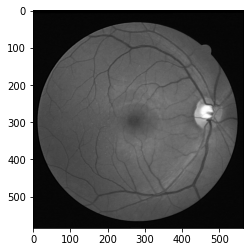

In [38]:
image = train_ids[-5]
gt_image = gt_ids[-5]

tdf = pd.DataFrame()  #Temporary data frame for each Image

path = train_path + "\\images\\" + image
print(path)

img = cv2.imread(path)
img = img[:,:,1]

plt.imshow(img ,cmap = "gray")

tdf,img2 = originalImg(img,tdf)
tdf['Image_Name'] = image
tdf = gaborFilter(img2,tdf)

tdf = cannyEdge(tdf,img)

tdf = the4edgeDetectors(tdf,img)

tdf = gmv(tdf,img)

gt_path = train_path + "\\1st_manual\\" + gt_image
print(gt_path)
tdf = gtImage(gt_path,tdf)

# image_dataset.append(df)
#     df = gtImage()

In [39]:
tdf.head()

,Original_Image,Image_Name,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,...,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3,Labels
0,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
1,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
2,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
3,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.000000,0.00000,0.000000,0.000000,0,1,0,0,False
4,0,36_training.tif,0,0,0,0,0,0,0,0,...,0,0.002773,0.00098,0.000735,0.001307,0,1,0,0,False


In [40]:
x = tdf.drop(labels = ["Image_Name","Labels"], axis=1)
x[:10]

,Original_Image,Gabor1,Gabor2,Gabor3,Gabor4,Gabor5,Gabor6,Gabor7,Gabor8,Gabor9,...,Gabor32,Canny_Edge,Roberts,Sobel,Scharr,Prewitt,Gaussian s3,Gaussian s7,Median s3,Variance s3
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0.000000,0.000000,0.000000,0.000000,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0.002773,0.000980,0.000735,0.001307,0,1,0,0
5,0,0,0,1,0,0,0,0,0,0,...,1,0,0.003922,0.002192,0.002312,0.002067,0,1,0,0
6,0,0,0,1,0,0,0,0,0,0,...,0,0,0.002773,0.002941,0.003186,0.002614,0,1,1,0
7,1,0,0,1,1,0,0,0,0,0,...,0,0,0.003922,0.000980,0.000735,0.001307,0,1,0,0
8,0,0,0,1,0,0,0,0,0,0,...,0,0,0.000000,0.002773,0.002773,0.002773,0,1,0,0
9,0,0,0,1,0,0,0,0,0,0,...,1,0,0.002773,0.000980,0.000735,0.001307,0,1,0,0


In [41]:
y = tdf["Labels"]
y[:10]

0    False
1    False
2    False
3    False
4    False
5    False
6    False
7    False
8    False
9    False
Name: Labels, dtype: bool

In [42]:
prediction_test = xg_cl.predict(x)

In [43]:
print ("Accuracy on the Original Image = ", metrics.accuracy_score(y, prediction_test))

Accuracy on the Original Image =  0.9530761304400533


In [44]:
confusion_matrix(y, prediction_test)

array([[290878,   3198],
       [ 12285,  23599]], dtype=int64)

In [45]:
f1_score(y, prediction_test, average="weighted")

0.9500317767387174

In [46]:
result = prediction_test.reshape((584, 565))

In [47]:
def gtImageDis(gt_path):
    frames, exts, image_specs = gif2numpy.convert(gt_path)
    frames = np.array(frames)
    labeled_img = frames.reshape(584, 565,3)
    labeled_img_dis = cv2.cvtColor(labeled_img, cv2.COLOR_BGR2GRAY)
    return labeled_img_dis

In [48]:
gt = gtImageDis(gt_path)

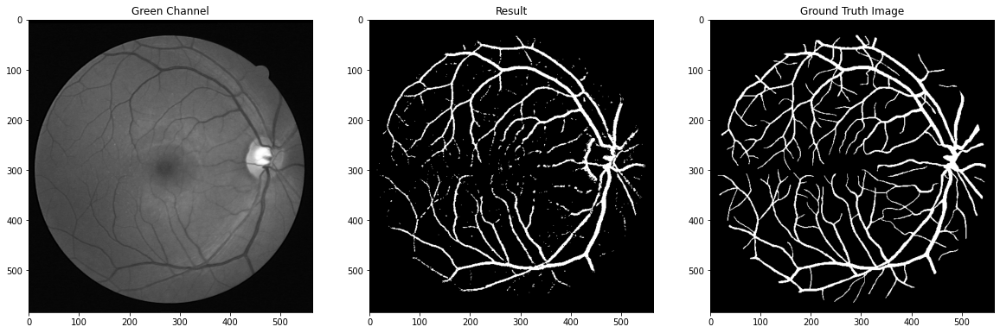

In [49]:
fig, axes = plt.subplots(1, 3, figsize=(20, 20))
ax = axes.ravel()
ax[0].set_title("Green Channel")
ax[0].imshow(img, cmap = 'gray')
ax[1].set_title("Result")
ax[1].imshow(result, cmap = 'gray')
ax[2].set_title("Ground Truth Image")
ax[2].imshow(gt, cmap = 'gray')


# Test All 

In [50]:
f1_set = []
score_set = []

In [51]:
from tqdm import tqdm

  0%|          | 0/20 [00:00<?, ?it/s]

D:\Data sets\DRIVE\training\images\21_training.tif
D:\Data sets\DRIVE\training\1st_manual\21_manual1.gif
Accuracy =  0.9671808704085344
0.9647138513016416


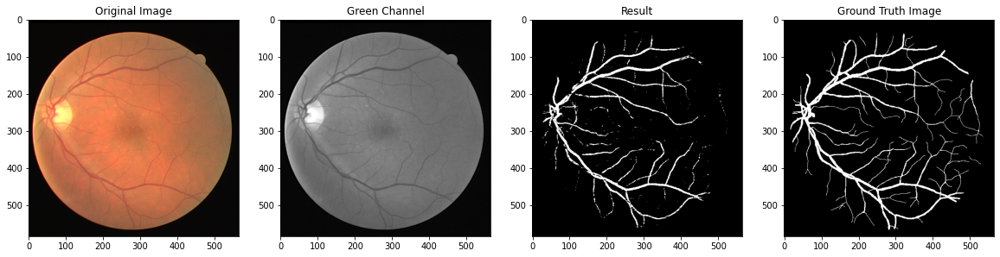

  5%|▌         | 1/20 [00:07<02:31,  7.96s/it]

D:\Data sets\DRIVE\training\images\22_training.tif
D:\Data sets\DRIVE\training\1st_manual\22_manual1.gif
Accuracy =  0.9617074796945084
0.9591912316663229


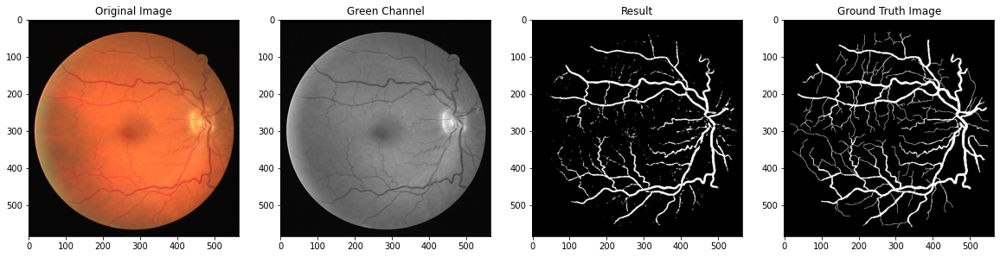

 10%|█         | 2/20 [00:17<02:32,  8.47s/it]

D:\Data sets\DRIVE\training\images\23_training.tif
D:\Data sets\DRIVE\training\1st_manual\23_manual1.gif
Accuracy =  0.9670899502970057
0.9664585876760214


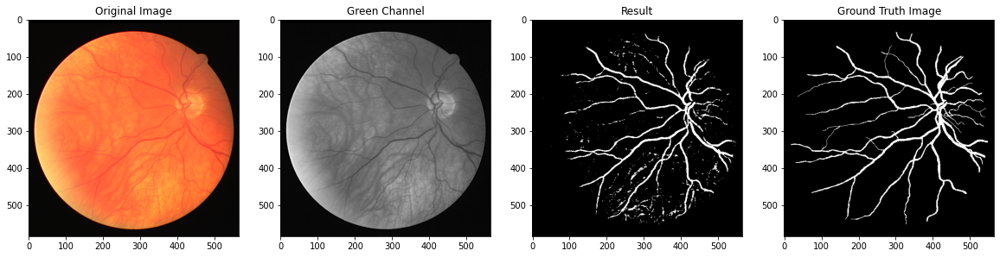

 15%|█▌        | 3/20 [00:25<02:19,  8.22s/it]

D:\Data sets\DRIVE\training\images\24_training.tif
D:\Data sets\DRIVE\training\1st_manual\24_manual1.gif
Accuracy =  0.9504030791611104
0.9458224218959378


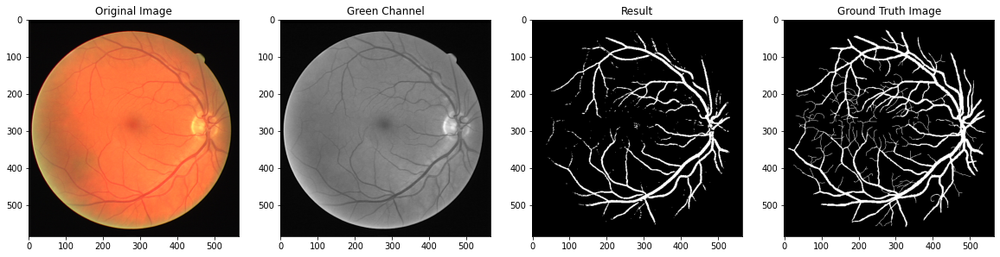

 20%|██        | 4/20 [00:33<02:10,  8.17s/it]

D:\Data sets\DRIVE\training\images\25_training.tif
D:\Data sets\DRIVE\training\1st_manual\25_manual1.gif
Accuracy =  0.9432810037580313
0.9353094966477518


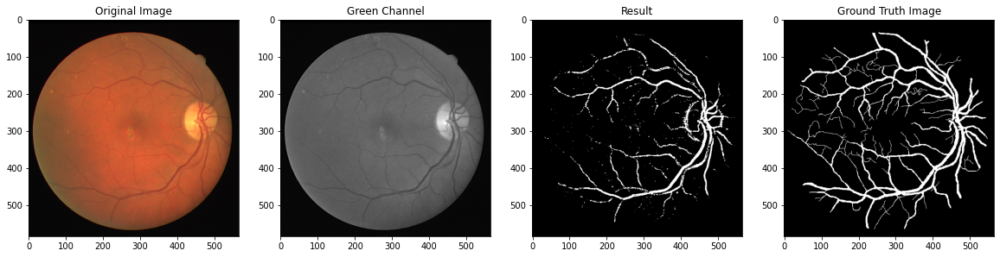

 25%|██▌       | 5/20 [00:41<02:04,  8.32s/it]

D:\Data sets\DRIVE\training\images\26_training.tif
D:\Data sets\DRIVE\training\1st_manual\26_manual1.gif
Accuracy =  0.9552945811613529
0.9520807086967648


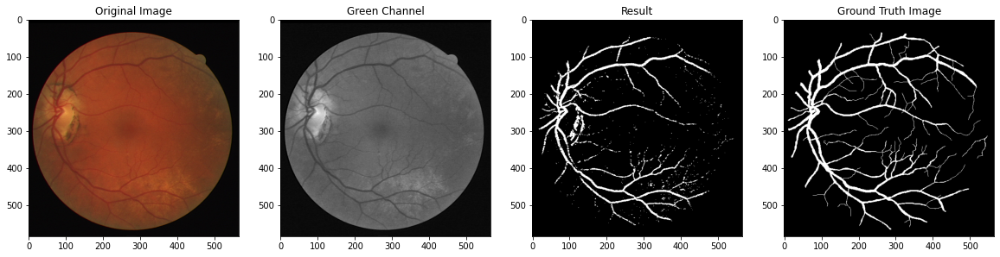

 30%|███       | 6/20 [00:49<01:53,  8.10s/it]

D:\Data sets\DRIVE\training\images\27_training.tif
D:\Data sets\DRIVE\training\1st_manual\27_manual1.gif
Accuracy =  0.9613013698630137
0.9591865599015471


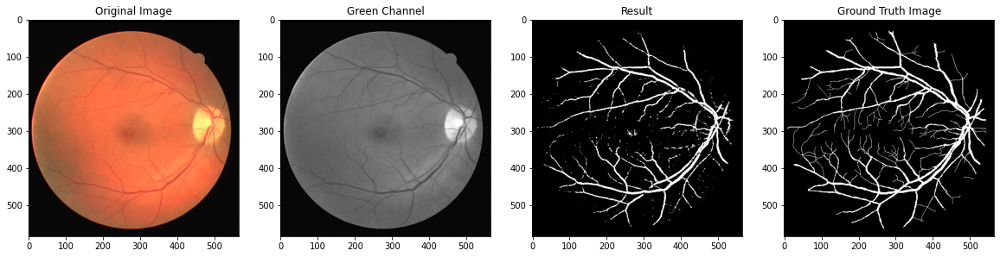

 35%|███▌      | 7/20 [00:57<01:42,  7.90s/it]

D:\Data sets\DRIVE\training\images\28_training.tif
D:\Data sets\DRIVE\training\1st_manual\28_manual1.gif
Accuracy =  0.9587434840586738
0.955699256647338


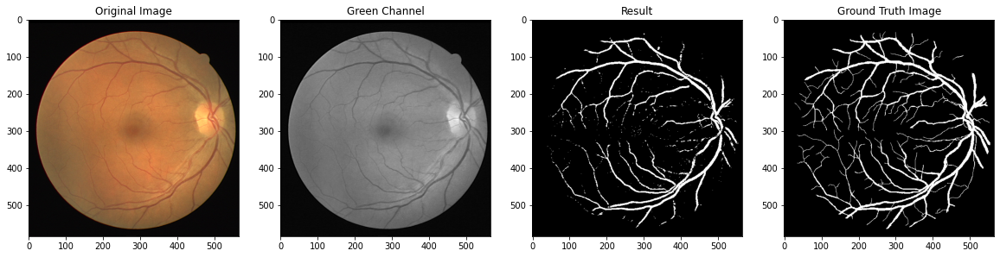

 40%|████      | 8/20 [01:04<01:34,  7.87s/it]

D:\Data sets\DRIVE\training\images\29_training.tif
D:\Data sets\DRIVE\training\1st_manual\29_manual1.gif
Accuracy =  0.9609801188022791
0.9590376994559053


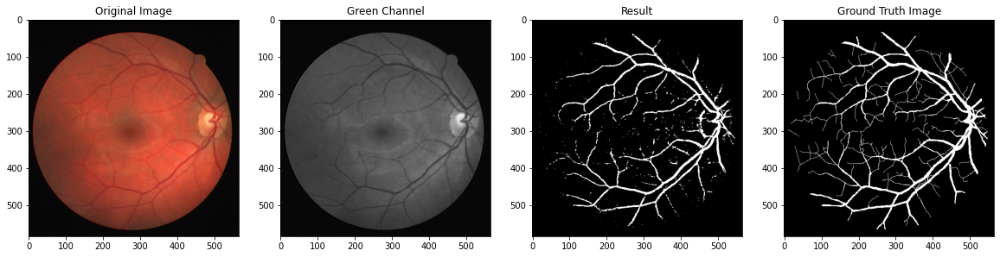

 45%|████▌     | 9/20 [01:12<01:25,  7.74s/it]

D:\Data sets\DRIVE\training\images\30_training.tif
D:\Data sets\DRIVE\training\1st_manual\30_manual1.gif
Accuracy =  0.9584858770760092
0.9549307176813647


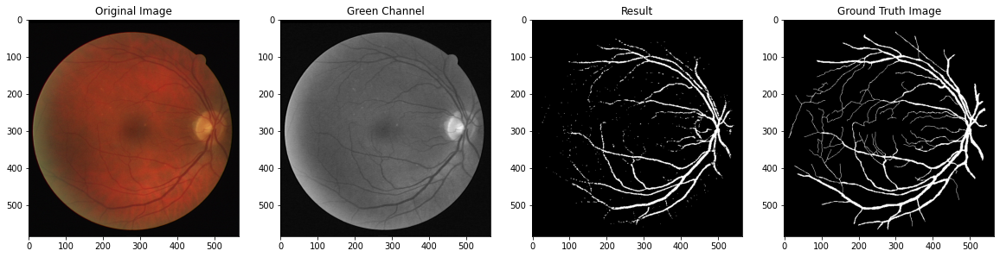

 50%|█████     | 10/20 [01:19<01:16,  7.62s/it]

D:\Data sets\DRIVE\training\images\31_training.tif
D:\Data sets\DRIVE\training\1st_manual\31_manual1.gif
Accuracy =  0.9671414716935386
0.9667428121311478


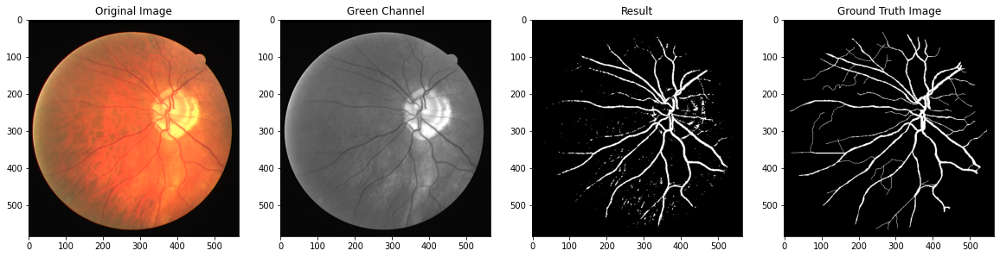

 55%|█████▌    | 11/20 [01:27<01:08,  7.61s/it]

D:\Data sets\DRIVE\training\images\32_training.tif
D:\Data sets\DRIVE\training\1st_manual\32_manual1.gif
Accuracy =  0.962604558128258
0.9592697072093089


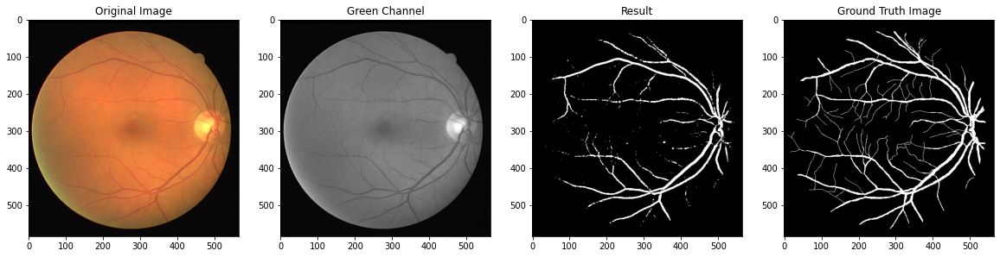

 60%|██████    | 12/20 [01:34<01:01,  7.64s/it]

D:\Data sets\DRIVE\training\images\33_training.tif
D:\Data sets\DRIVE\training\1st_manual\33_manual1.gif
Accuracy =  0.9630076372893684
0.9599520132733557


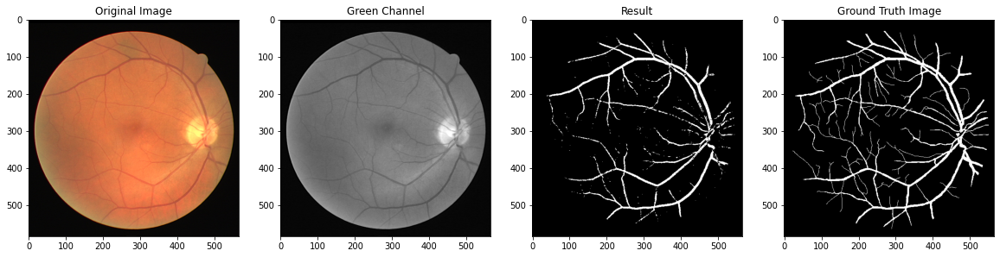

 65%|██████▌   | 13/20 [01:42<00:53,  7.58s/it]

D:\Data sets\DRIVE\training\images\34_training.tif
D:\Data sets\DRIVE\training\1st_manual\34_manual1.gif
Accuracy =  0.921466238331919
0.9243006038835774


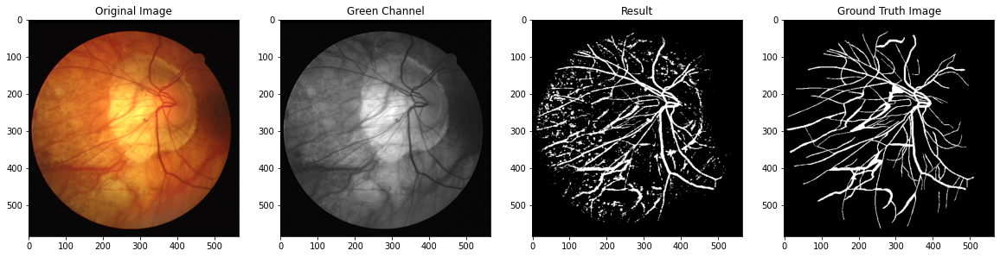

 70%|███████   | 14/20 [01:49<00:45,  7.55s/it]

D:\Data sets\DRIVE\training\images\35_training.tif
D:\Data sets\DRIVE\training\1st_manual\35_manual1.gif
Accuracy =  0.965426112256031
0.9645522346560729


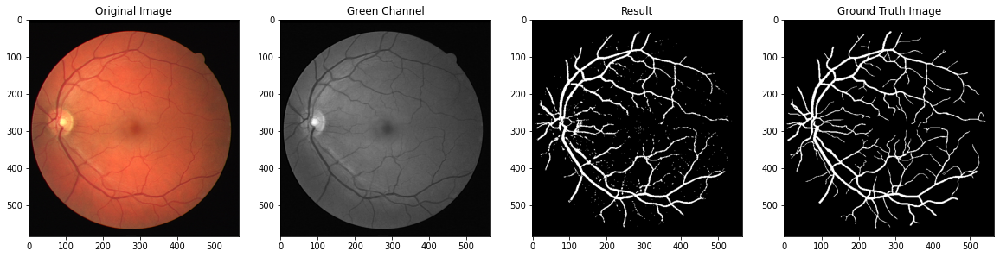

 75%|███████▌  | 15/20 [01:57<00:37,  7.47s/it]

D:\Data sets\DRIVE\training\images\36_training.tif
D:\Data sets\DRIVE\training\1st_manual\36_manual1.gif
Accuracy =  0.9530761304400533
0.9500317767387174


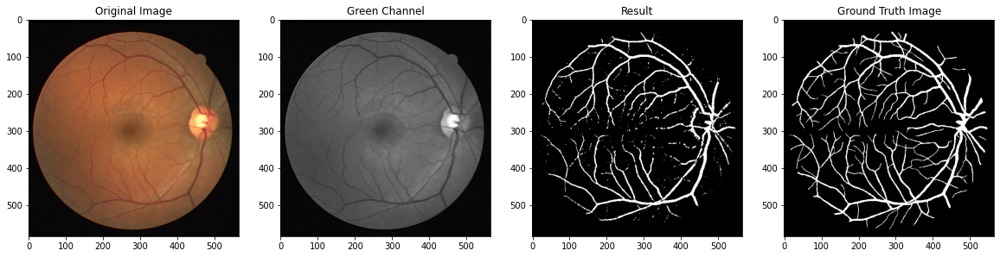

 80%|████████  | 16/20 [02:04<00:29,  7.38s/it]

D:\Data sets\DRIVE\training\images\37_training.tif
D:\Data sets\DRIVE\training\1st_manual\37_manual1.gif
Accuracy =  0.9605133955630986
0.9599066746471696


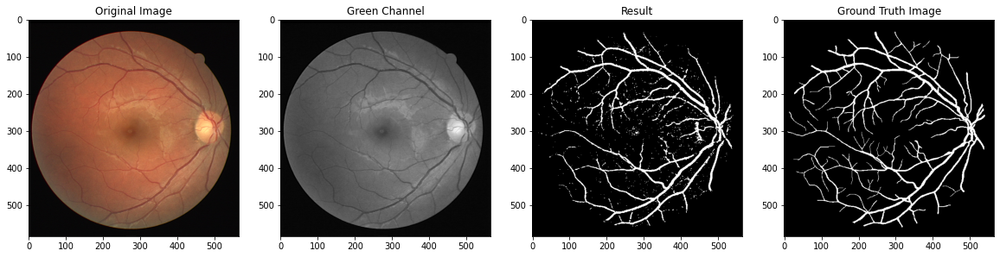

 85%|████████▌ | 17/20 [02:11<00:22,  7.34s/it]

D:\Data sets\DRIVE\training\images\38_training.tif
D:\Data sets\DRIVE\training\1st_manual\38_manual1.gif
Accuracy =  0.9490756455327919
0.9420744233994104


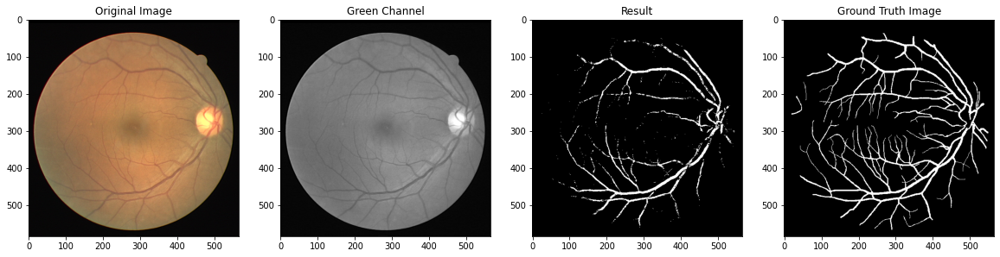

 90%|█████████ | 18/20 [02:18<00:14,  7.27s/it]

D:\Data sets\DRIVE\training\images\39_training.tif
D:\Data sets\DRIVE\training\1st_manual\39_manual1.gif
Accuracy =  0.9584434476906292
0.9565825997787464


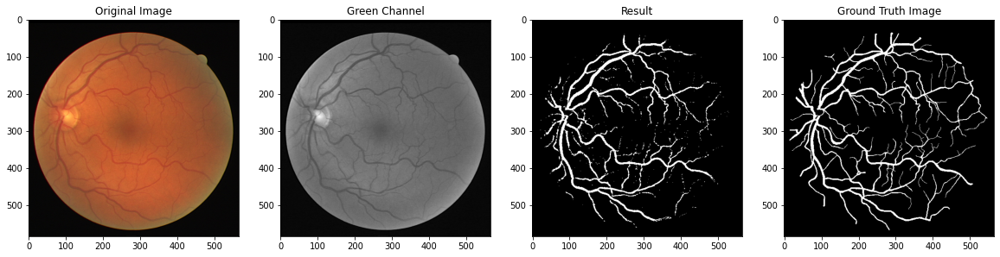

 95%|█████████▌| 19/20 [02:25<00:07,  7.24s/it]

D:\Data sets\DRIVE\training\images\40_training.tif
D:\Data sets\DRIVE\training\1st_manual\40_manual1.gif
Accuracy =  0.964680567341496
0.963670204214515


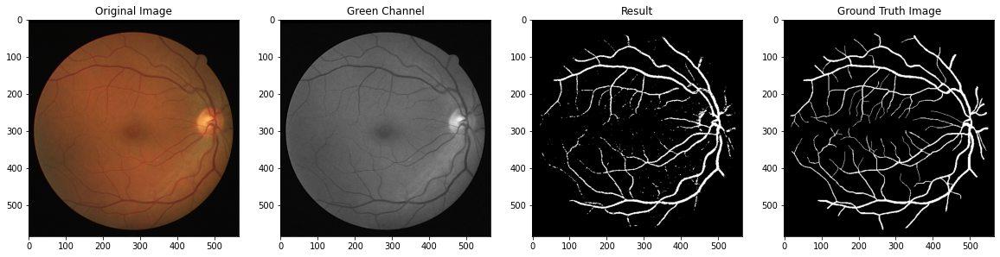

100%|██████████| 20/20 [02:33<00:00,  7.65s/it]


In [52]:
for _id in tqdm(range(len(train_ids))):
    
    image = train_ids[_id]
    gt_image = gt_ids[_id]
    

    tdf = pd.DataFrame()  #Temporary data frame for each Image

    path = train_path + "\\images\\" + image
    print(path)

    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[:,:,1]

#     plt.imshow(img ,cmap = "gray")

    tdf,img2 = originalImg(img,tdf)
    tdf['Image_Name'] = image
    tdf = gaborFilter(img2,tdf)

    tdf = cannyEdge(tdf,img)

    tdf = the4edgeDetectors(tdf,img)

    tdf = gmv(tdf,img)

    gt_path = train_path + "\\1st_manual\\" + gt_image
    print(gt_path)
    tdf = gtImage(gt_path,tdf)
    
    x = tdf.drop(labels = ["Image_Name","Labels"], axis=1)
    y = tdf["Labels"]
    
    prediction_test = xg_cl.predict(x)
    result = prediction_test.reshape((584, 565))
    
    
    gtImg = gtImageDis(gt_path)


    
    fig, axes = plt.subplots(1, 4, figsize=(20, 20))
    ax = axes.ravel()
    ax[0].set_title("Original Image")
    ax[0].imshow(img_rgb, cmap = 'gray')
    ax[1].set_title("Green Channel")
    ax[1].imshow(img, cmap = 'gray')
    ax[2].set_title("Result")
    ax[2].imshow(result, cmap = 'gray')
    ax[3].set_title("Ground Truth Image")
    ax[3].imshow(gtImg, cmap = 'gray')
    
    acc = metrics.accuracy_score(y, prediction_test)
    print ("Accuracy = ", acc)
    
    cm = confusion_matrix(y, prediction_test)
    sens, spe, acc = getMetrics(cm)
    
    print(f1_score(y, prediction_test, average = "weighted"))
    f1_set.append([train_ids[_id],f1_score(y, prediction_test, average = "weighted")])
    score_set.append([train_ids[_id], sens, spe, acc])
    
    filename = "processed//Train" + str(_id + 21) + ".tif"
#     cv2.imwrite(filename, result)
    
    plt.show()

In [53]:
f1_df = pd.DataFrame(f1_set, columns=["Image","F1 Score"])
f1_df

,Image,F1 Score
0,21_training.tif,0.964714
1,22_training.tif,0.959191
2,23_training.tif,0.966459
3,24_training.tif,0.945822
4,25_training.tif,0.935309
5,26_training.tif,0.952081
6,27_training.tif,0.959187
7,28_training.tif,0.955699
8,29_training.tif,0.959038
9,30_training.tif,0.954931


# The Final Result

In [54]:
score_df = pd.DataFrame(score_set, columns=["Image","Sensitivity", "Specificity", "Accuracy"])
score_df

,Image,Sensitivity,Specificity,Accuracy
0,21_training.tif,0.641415,0.993492,0.967181
1,22_training.tif,0.662384,0.991434,0.961707
2,23_training.tif,0.710537,0.985171,0.967090
3,24_training.tif,0.614690,0.994396,0.950403
4,25_training.tif,0.470618,0.993463,0.943281
5,26_training.tif,0.597614,0.987910,0.955295
6,27_training.tif,0.673649,0.989096,0.961301
7,28_training.tif,0.649032,0.992268,0.958743
8,29_training.tif,0.670174,0.987684,0.960980
9,30_training.tif,0.579740,0.990726,0.958486


In [55]:
score_df["Sensitivity"].mean(), score_df["Specificity"].mean() ,score_df["Accuracy"].mean()

(0.6445603136769661, 0.987275148720936, 0.957495150927385)

In [56]:
import seaborn as sns

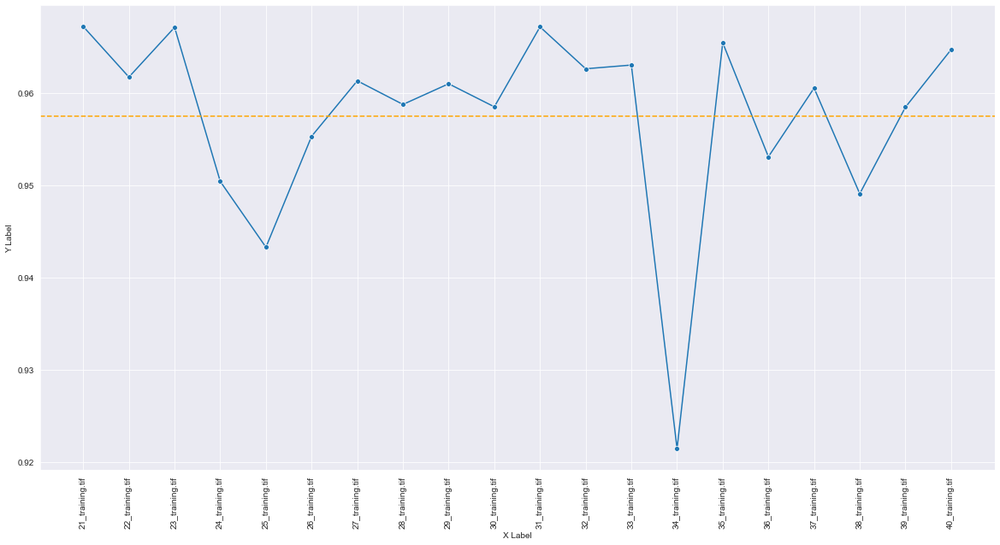

In [60]:
plt.figure(figsize=(20, 10))
sns.set_style("darkgrid")
ax = sns.lineplot(data=score_df, x="Image", y="Accuracy", marker = "o")
ax.axhline(score_df["Accuracy"].mean(), color="orange", linestyle="--")
ax.set(xlabel="X Label", ylabel = "Y Label")
plt.setp(ax.get_xticklabels(), rotation=90)
ax.figure.savefig("output.png")

In [61]:
import pickle

In [62]:
algo_name = "xgboostTop152"
pickle.dump(xg_cl, open(algo_name,'wb'))

In [ ]:
xg_cl

# Importance

In [71]:
xgb_fea_imp=pd.DataFrame(list(xg_cl.get_booster().get_fscore().items()),
columns=['feature','importance']).sort_values('importance', ascending=False)
print('',xgb_fea_imp)

            feature  importance
3      Gaussian s7        1083
6        Median s3         641
1      Gaussian s3         589
2   Original_Image         433
0      Variance s3         386
7          Roberts         373
8          Prewitt         354
4           Scharr         278
21         Gabor32         165
11           Sobel         155
13         Gabor31         129
10         Gabor21         111
19         Gabor30         110
16         Gabor23         109
14         Gabor29         101
12      Canny_Edge          57
18          Gabor3          49
9           Gabor4          45
27         Gabor24          35
26          Gabor5          33
20         Gabor16          26
5           Gabor6          25
23         Gabor22          24
17         Gabor20          17
29         Gabor15          16
15          Gabor7          12
28          Gabor8          11
24         Gabor19          10
25         Gabor28           6
22         Gabor27           4


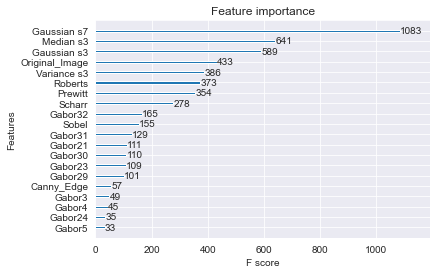

In [67]:
xgb.plot_importance(xg_cl, max_num_features=20)
plt.show()

# The Test Images

In [76]:
# Next time change th path format
test_path = "D:\\Data sets\\DRIVE\\test"
test_ids = next(os.walk(test_path + "\\images"))[2]

In [77]:
test_ids

['01_test.tif',
 '02_test.tif',
 '03_test.tif',
 '04_test.tif',
 '05_test.tif',
 '06_test.tif',
 '07_test.tif',
 '08_test.tif',
 '09_test.tif',
 '10_test.tif',
 '11_test.tif',
 '12_test.tif',
 '13_test.tif',
 '14_test.tif',
 '15_test.tif',
 '16_test.tif',
 '17_test.tif',
 '18_test.tif',
 '19_test.tif',
 '20_test.tif']

  0%|          | 0/20 [00:00<?, ?it/s]

D:\Data sets\DRIVE\test\images\01_test.tif


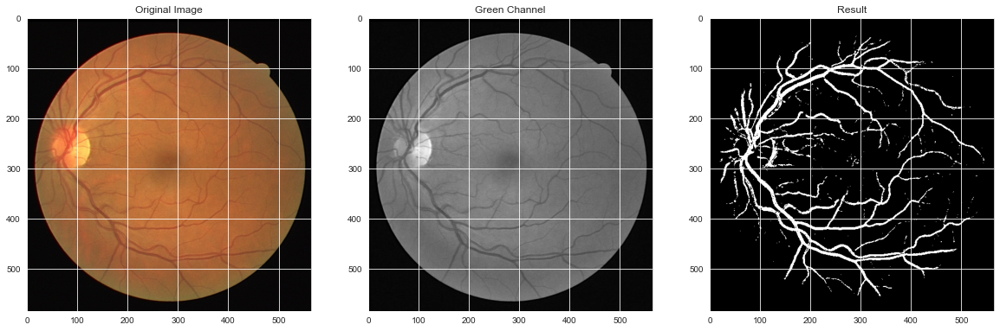

  5%|▌         | 1/20 [00:06<01:59,  6.27s/it]

D:\Data sets\DRIVE\test\images\02_test.tif


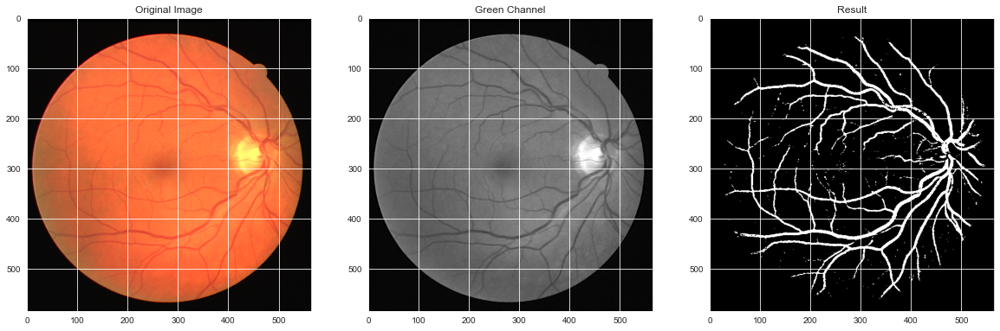

 10%|█         | 2/20 [00:12<01:54,  6.38s/it]

D:\Data sets\DRIVE\test\images\03_test.tif


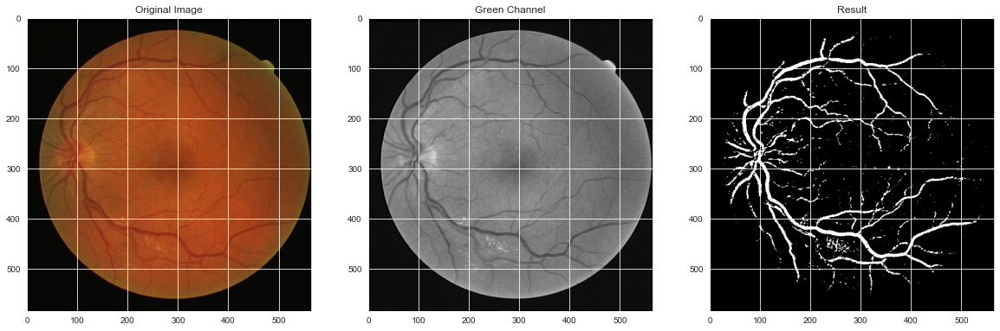

 15%|█▌        | 3/20 [00:18<01:46,  6.26s/it]

D:\Data sets\DRIVE\test\images\04_test.tif


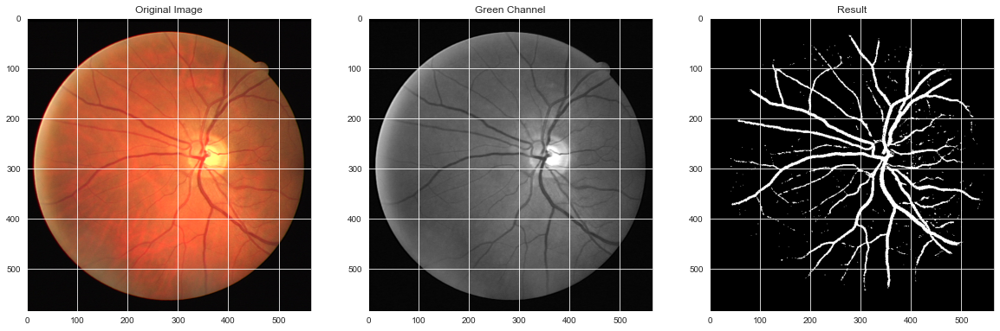

 20%|██        | 4/20 [00:25<01:40,  6.27s/it]

D:\Data sets\DRIVE\test\images\05_test.tif


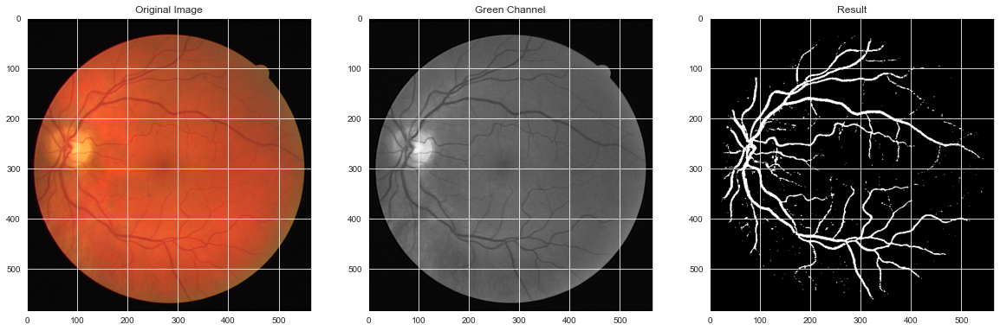

 25%|██▌       | 5/20 [00:31<01:33,  6.23s/it]

D:\Data sets\DRIVE\test\images\06_test.tif


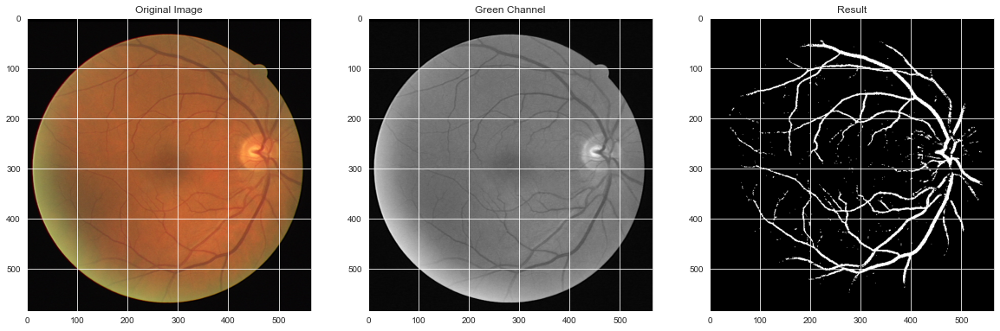

 30%|███       | 6/20 [00:37<01:26,  6.17s/it]

D:\Data sets\DRIVE\test\images\07_test.tif


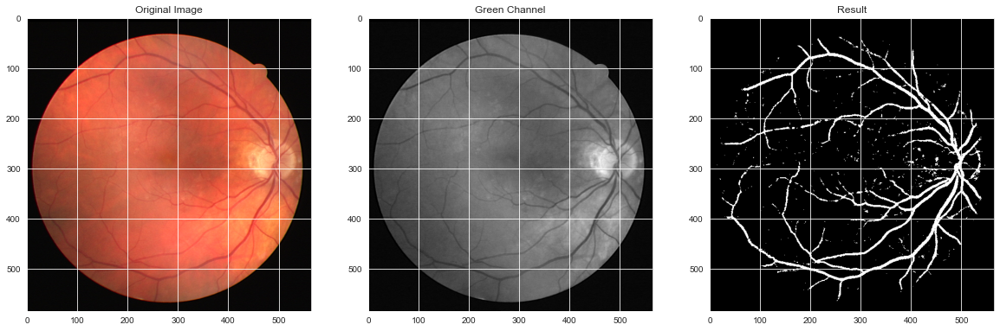

 35%|███▌      | 7/20 [00:43<01:19,  6.12s/it]

D:\Data sets\DRIVE\test\images\08_test.tif


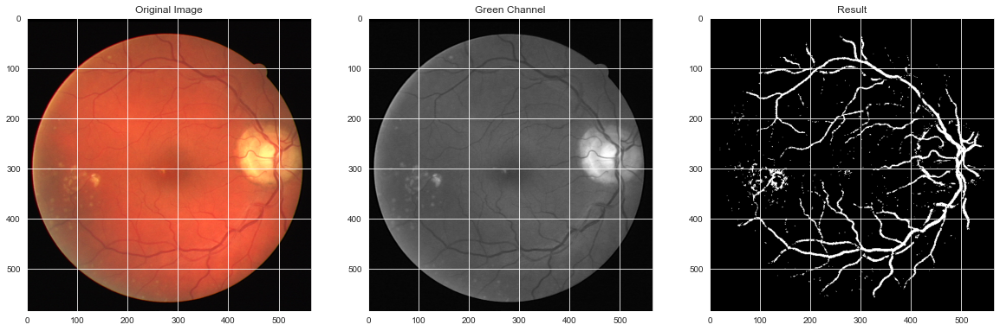

 40%|████      | 8/20 [00:49<01:13,  6.15s/it]

D:\Data sets\DRIVE\test\images\09_test.tif


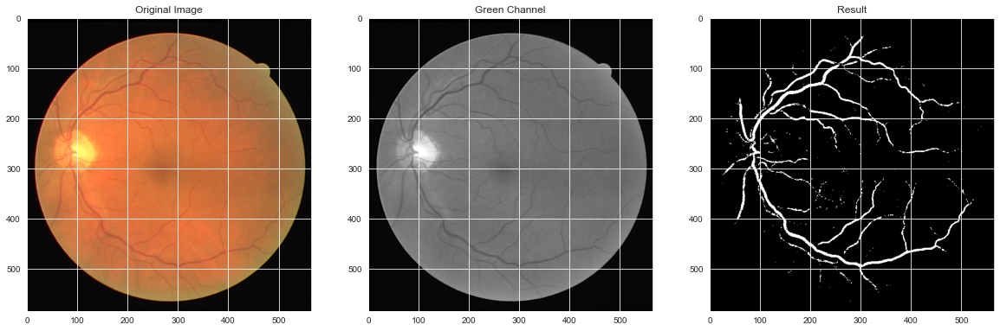

 45%|████▌     | 9/20 [00:55<01:08,  6.21s/it]

D:\Data sets\DRIVE\test\images\10_test.tif


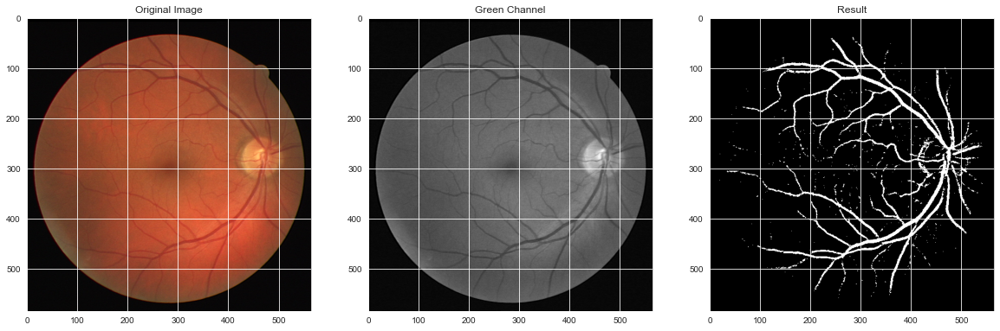

 50%|█████     | 10/20 [01:02<01:02,  6.26s/it]

D:\Data sets\DRIVE\test\images\11_test.tif


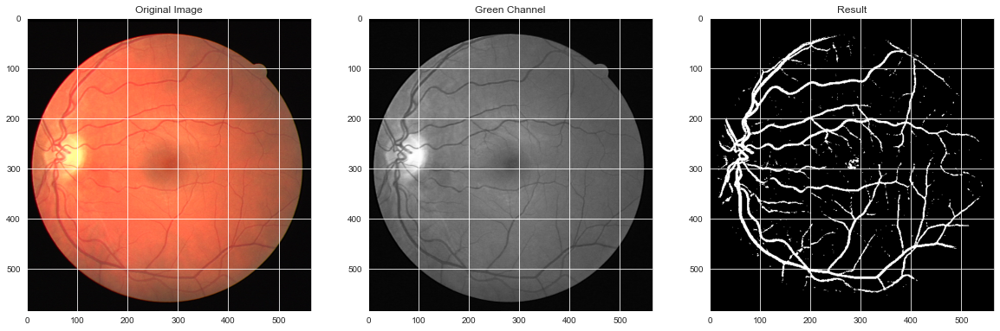

 55%|█████▌    | 11/20 [01:08<00:56,  6.29s/it]

D:\Data sets\DRIVE\test\images\12_test.tif


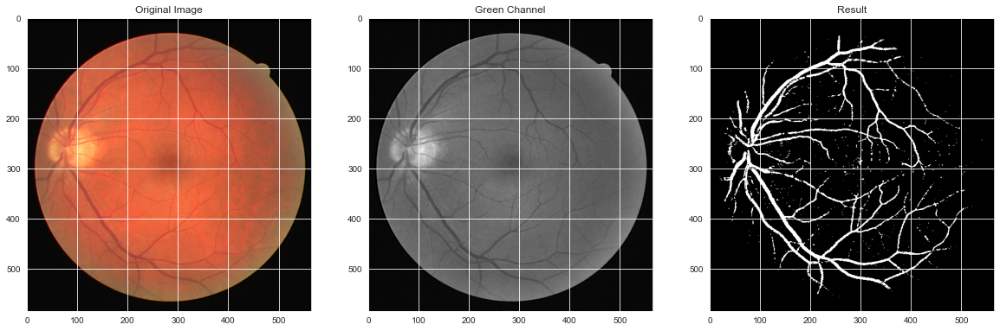

 60%|██████    | 12/20 [01:14<00:50,  6.29s/it]

D:\Data sets\DRIVE\test\images\13_test.tif


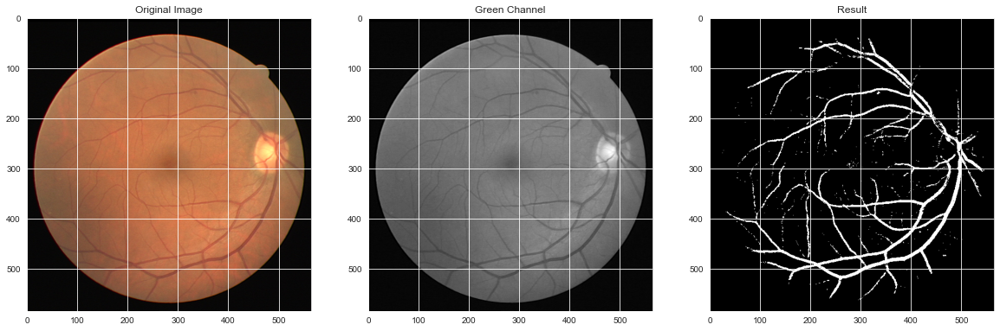

 65%|██████▌   | 13/20 [01:21<00:43,  6.24s/it]

D:\Data sets\DRIVE\test\images\14_test.tif


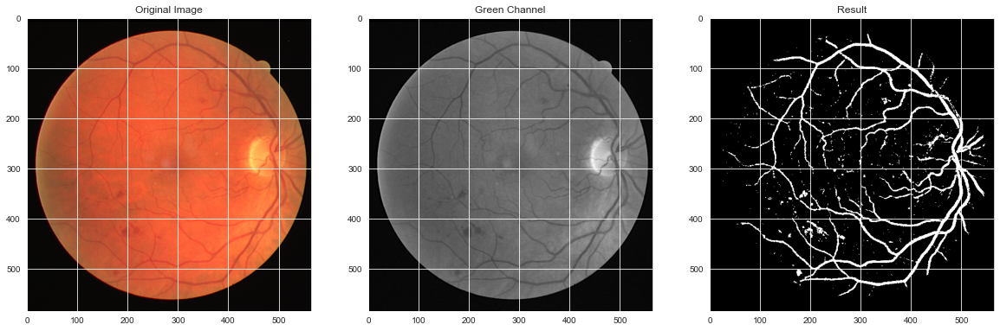

 70%|███████   | 14/20 [01:27<00:37,  6.24s/it]

D:\Data sets\DRIVE\test\images\15_test.tif


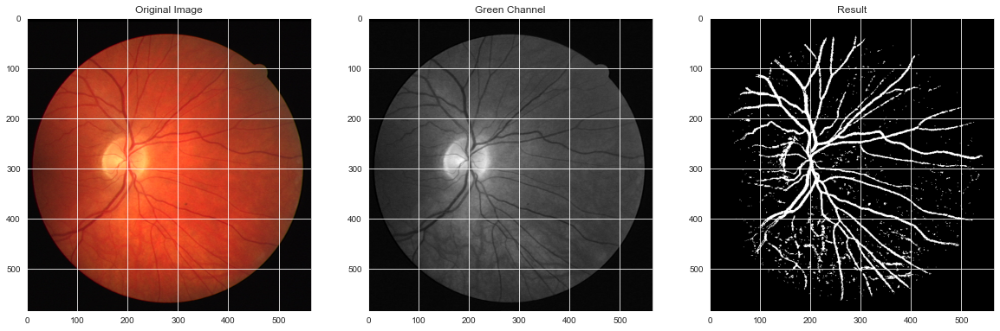

 75%|███████▌  | 15/20 [01:33<00:31,  6.30s/it]

D:\Data sets\DRIVE\test\images\16_test.tif


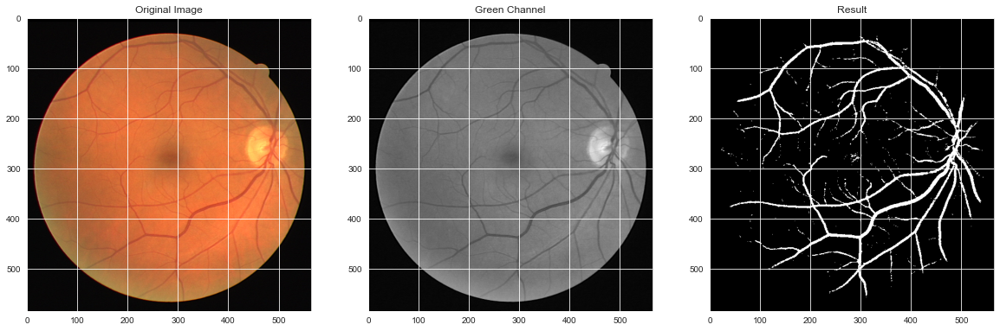

 80%|████████  | 16/20 [01:40<00:25,  6.40s/it]

D:\Data sets\DRIVE\test\images\17_test.tif


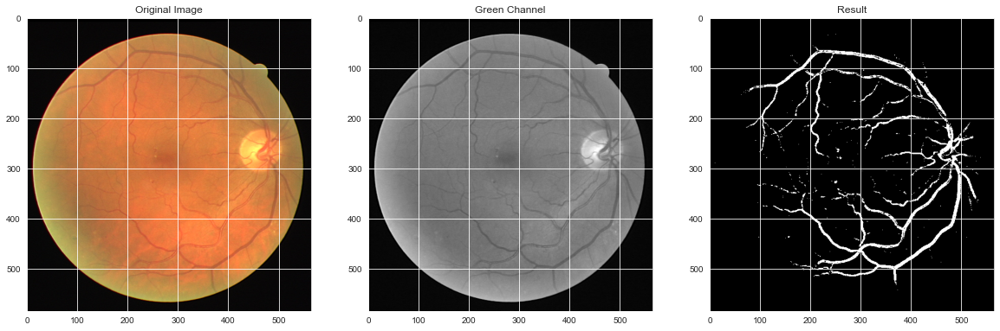

 85%|████████▌ | 17/20 [01:46<00:19,  6.37s/it]

D:\Data sets\DRIVE\test\images\18_test.tif


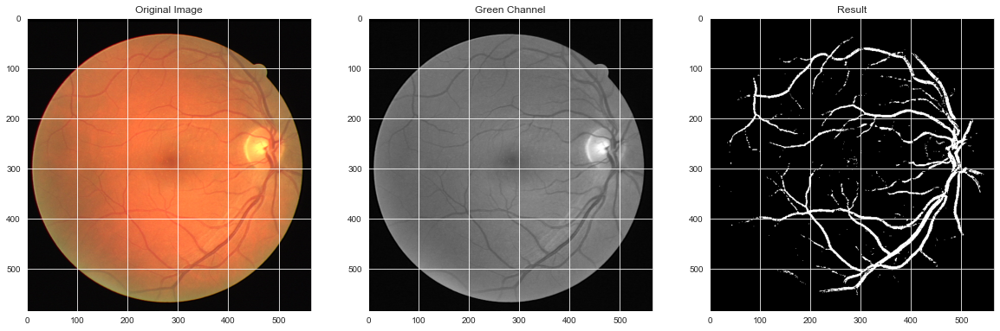

 90%|█████████ | 18/20 [01:52<00:12,  6.31s/it]

D:\Data sets\DRIVE\test\images\19_test.tif


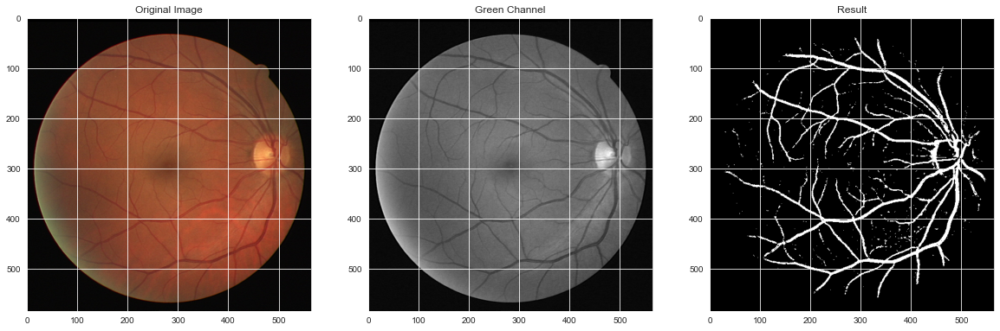

 95%|█████████▌| 19/20 [01:58<00:06,  6.23s/it]

D:\Data sets\DRIVE\test\images\20_test.tif


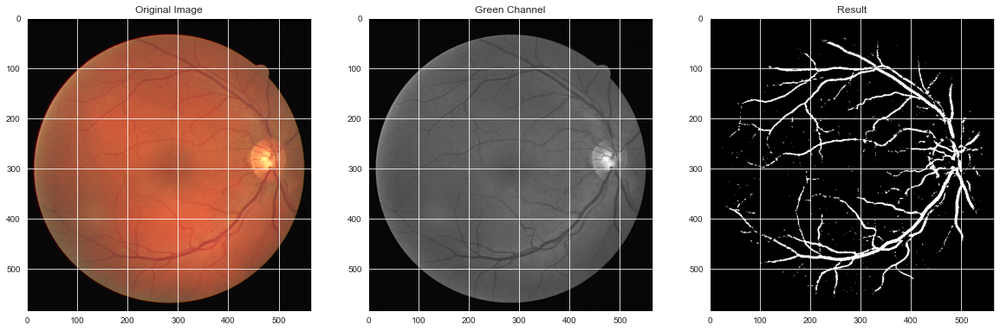

100%|██████████| 20/20 [02:05<00:00,  6.26s/it]


In [84]:
for _id in tqdm(range(len(test_ids))):
    
    image = test_ids[_id]

    tdf = pd.DataFrame()  #Temporary data frame for each Image

    path = test_path + "\\images\\" + image
    print(path)

    img = cv2.imread(path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img[:,:,1]

#     plt.imshow(img ,cmap = "gray")

    tdf,img2 = originalImg(img,tdf)
    tdf['Image_Name'] = image
    tdf = gaborFilter(img2,tdf)

    tdf = cannyEdge(tdf,img)

    tdf = the4edgeDetectors(tdf,img)

    tdf = gmv(tdf,img)

    
    x = tdf.drop(labels = ["Image_Name"], axis=1)
    
    prediction_test = xg_cl.predict(x)
    result = prediction_test.reshape((584, 565))


    
    fig, axes = plt.subplots(1, 3, figsize=(20, 20))
    ax = axes.ravel()
    ax[0].set_title("Original Image")
    ax[0].imshow(img_rgb, cmap = 'gray')
    ax[1].set_title("Green Channel")
    ax[1].imshow(img, cmap = 'gray')
    ax[2].set_title("Result")
    ax[2].imshow(result, cmap = 'gray')

    filename = str(_id + 1) + ".png"
    cv2.imwrite(filename, result)


    plt.show()